### Visualising DC clusters only (re-doing from pre-hvg onwards instead of just re-mapping before calculating DEGs)
### Using bbknn for batch correction instead of harmony

In [1]:
#load packages I need
import os
import tools
import scanpy as sc
import pandas as pd
import dandelion as ddl
from tqdm import tqdm
import matplotlib.pyplot as plt
import scanpy.external as sce
from matplotlib.pyplot import rc_context
import seaborn as sns

In [2]:
#set current directory 
os.chdir('/scratch/user/s4436039/scdata/Myeloid_Objects')
os.getcwd()

'/scratch/user/s4436039/scdata/Myeloid_Objects'

In [ ]:
# read in data
# data_labels = sc.read_h5ad('NRclean_clustered2_DC.h5ad')
# data_clean_prehvg = sc.read_h5ad('NR_cleandata.h5ad')

In [3]:
# read in data
data = sc.read_h5ad('20250617_AllDC_bbknn.h5ad')

In [4]:
data

AnnData object with n_obs × n_vars = 29887 × 1746
    obs: 'nCount_RNA', 'nFeature_RNA', 'sample_type', 'cancer_type', 'patient_id', 'sample_id', 'percent.mt', 'site', 'sample_type_major', 'cancer_subtype', 'integration_id', 'ident', 'dataset_id', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'S_score', 'G2M_score', 'keep_or_remove', 'leiden', 'celltype', 'leiden_DC', 'leiden_DC_v2', 'exclude_annots', 'leiden_M', 'Technology', 'NR_annotations_simple', 'sample_type_major2', 'cancer_with_H', 'cancer_broadest', 'patient_treatment', 'DC1_sig', 'DC2_sig', 'DC3_sig', 'mregDC_sig'
    var: 'name', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions'

In [7]:
data_clean_prehvg

AnnData object with n_obs × n_vars = 498382 × 15074
    obs: 'nCount_RNA', 'nFeature_RNA', 'sample_type', 'cancer_type', 'patient_id', 'sample_id', 'percent.mt', 'site', 'sample_type_major', 'cancer_subtype', 'integration_id', 'ident', 'dataset_id', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'S_score', 'G2M_score', 'keep_or_remove', 'leiden', 'celltype', 'leiden_DC', 'leiden_DC_v2', 'exclude_annots', 'leiden_M', 'Technology'
    var: 'name', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'log1p'

In [8]:
#subset data_clean_prehvg to only the cells in data_labels based on barcode

# Get the list of barcodes (cell names) in data_labels
barcodes_to_keep = data_labels.obs.index

# subset data_clean_prehvg to just those in data_labels
data_clean_prehvg2 = data_clean_prehvg[data_clean_prehvg.obs.index.isin(barcodes_to_keep), :]

data_clean_prehvg2

View of AnnData object with n_obs × n_vars = 30241 × 15074
    obs: 'nCount_RNA', 'nFeature_RNA', 'sample_type', 'cancer_type', 'patient_id', 'sample_id', 'percent.mt', 'site', 'sample_type_major', 'cancer_subtype', 'integration_id', 'ident', 'dataset_id', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'S_score', 'G2M_score', 'keep_or_remove', 'leiden', 'celltype', 'leiden_DC', 'leiden_DC_v2', 'exclude_annots', 'leiden_M', 'Technology'
    var: 'name', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'log1p'

In [9]:
# transfer metadata from final atlas (data_labels) to clean data pre-hvg (want pre-hvg data so I can re-do hvg calculation on just DC2)

#define columns to transfer
meta_columns = ['Technology','NR_annotations_simple','sample_type_major2','cancer_with_H','cancer_broadest','patient_treatment']

# Subset the metadata in data_labels to match data_clean_prehvg2's barcodes
metadata_to_transfer = data_labels.obs.loc[data_clean_prehvg2.obs.index, meta_columns]

# Add these columns to data_clean_prehvg2's obs
for col in meta_columns:
    data_clean_prehvg2.obs[col] = metadata_to_transfer[col]

# Verify that the metadata was transferred
data_clean_prehvg2.obs.tail()

/scratch/temp/14490072/ipykernel_2867082/846974978.py:11: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.


,nCount_RNA,nFeature_RNA,sample_type,cancer_type,patient_id,sample_id,percent.mt,site,sample_type_major,cancer_subtype,...,leiden_DC,leiden_DC_v2,exclude_annots,leiden_M,Technology,NR_annotations_simple,sample_type_major2,cancer_with_H,cancer_broadest,patient_treatment
GSE180661_HGSOC_SPECTRUM-OV-045_S1_CD45P_LEFT_OVARY_GTTTACTCAAGGCCTC,-9.995153,-8.131683,Adnexa,HGSOC,Left Adnexa,SPECTRUM-OV-045_S1_CD45P_LEFT_OVARY,2694.0,ovary,primary tumour,HGSOC,...,4,1,NA,NaN,10x3',cDC1,primary tumour,HGSOC,HGSOC,Treatment naive
GSE180661_HGSOC_SPECTRUM-OV-045_S1_CD45P_LEFT_OVARY_TACCGAACAAACCGGA,-9.134331,-8.627023,Adnexa,HGSOC,Left Adnexa,SPECTRUM-OV-045_S1_CD45P_LEFT_OVARY,839.0,ovary,primary tumour,HGSOC,...,2,4,NA,NaN,10x3',cDC2,primary tumour,HGSOC,HGSOC,Treatment naive
GSE180661_HGSOC_SPECTRUM-OV-045_S1_CD45P_LEFT_OVARY_TCACGCTTCCGTCACT,-10.033317,-7.518040,Adnexa,HGSOC,Left Adnexa,SPECTRUM-OV-045_S1_CD45P_LEFT_OVARY,1683.0,ovary,primary tumour,HGSOC,...,3,2,NA,NaN,10x3',mregDC,primary tumour,HGSOC,HGSOC,Treatment naive
GSE180661_HGSOC_SPECTRUM-OV-045_S1_CD45P_LEFT_OVARY_TGCAGTAGTGTTGCCG,-9.364501,-8.566583,Adnexa,HGSOC,Left Adnexa,SPECTRUM-OV-045_S1_CD45P_LEFT_OVARY,2257.0,ovary,primary tumour,HGSOC,...,5,15,NA,NaN,10x3',cDC2,primary tumour,HGSOC,HGSOC,Treatment naive
GSE180661_HGSOC_SPECTRUM-OV-045_S1_CD45P_LEFT_OVARY_TGTGAGTTCGGAAACG,-9.738727,-7.459797,Adnexa,HGSOC,Left Adnexa,SPECTRUM-OV-045_S1_CD45P_LEFT_OVARY,949.0,ovary,primary tumour,HGSOC,...,3,2,NA,NaN,10x3',mregDC,primary tumour,HGSOC,HGSOC,Treatment naive


In [10]:
data_labels.obs["NR_annotations_simple"].value_counts()

NR_annotations_simple
cDC2      17391
cDC1       6730
mregDC     6120
Name: count, dtype: int64

In [11]:
# check
data_clean_prehvg2.obs["NR_annotations_simple"].value_counts()

NR_annotations_simple
cDC2      17391
cDC1       6730
mregDC     6120
Name: count, dtype: int64

In [12]:
# rename to data
data = data_clean_prehvg2

In [13]:
# check
data.obs["NR_annotations_simple"].value_counts()

NR_annotations_simple
cDC2      17391
cDC1       6730
mregDC     6120
Name: count, dtype: int64

# Filtering:

In [14]:
# remove any samples with less than 10 cells
data = data[data.obs['integration_id'].map(data.obs['integration_id'].value_counts()) >= 10].copy()

In [15]:
# remove any genes expressed in less than 10 cells
sc.pp.filter_genes(data, min_cells=10)

In [16]:
data

AnnData object with n_obs × n_vars = 29887 × 14529
    obs: 'nCount_RNA', 'nFeature_RNA', 'sample_type', 'cancer_type', 'patient_id', 'sample_id', 'percent.mt', 'site', 'sample_type_major', 'cancer_subtype', 'integration_id', 'ident', 'dataset_id', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'S_score', 'G2M_score', 'keep_or_remove', 'leiden', 'celltype', 'leiden_DC', 'leiden_DC_v2', 'exclude_annots', 'leiden_M', 'Technology', 'NR_annotations_simple', 'sample_type_major2', 'cancer_with_H', 'cancer_broadest', 'patient_treatment'
    var: 'name', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    uns: 'log1p'

# pre-hvg to integration on new DC2 only object:

In [17]:
# identify highly variable genes
sc.pp.highly_variable_genes(data, min_mean=0.0125, max_mean=3, min_disp=0.5)
data

AnnData object with n_obs × n_vars = 29887 × 14529
    obs: 'nCount_RNA', 'nFeature_RNA', 'sample_type', 'cancer_type', 'patient_id', 'sample_id', 'percent.mt', 'site', 'sample_type_major', 'cancer_subtype', 'integration_id', 'ident', 'dataset_id', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'S_score', 'G2M_score', 'keep_or_remove', 'leiden', 'celltype', 'leiden_DC', 'leiden_DC_v2', 'exclude_annots', 'leiden_M', 'Technology', 'NR_annotations_simple', 'sample_type_major2', 'cancer_with_H', 'cancer_broadest', 'patient_treatment'
    var: 'name', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'

In [18]:
#set hidden slot
data.raw = data

In [19]:
#to get number of HV genes
print(data.var.highly_variable.sum())

1746


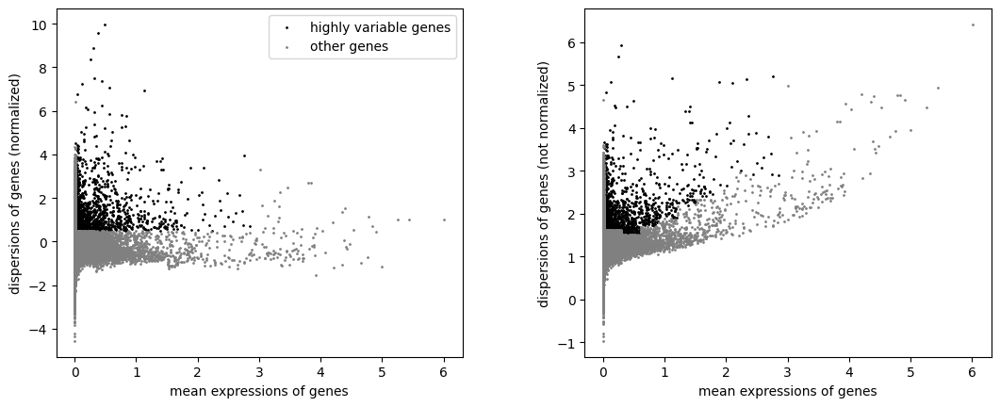

In [20]:
#plot out the number of highly variable genes
sc.pl.highly_variable_genes(data)

### regress out factors and perform scaling

In [21]:
# Actually do the filtering for PCA
data = data[
    :, data.var.highly_variable
].copy()  # all rows/indexes : columns only selecting for those within high_variable, and then making a copy of itself
data

AnnData object with n_obs × n_vars = 29887 × 1746
    obs: 'nCount_RNA', 'nFeature_RNA', 'sample_type', 'cancer_type', 'patient_id', 'sample_id', 'percent.mt', 'site', 'sample_type_major', 'cancer_subtype', 'integration_id', 'ident', 'dataset_id', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'S_score', 'G2M_score', 'keep_or_remove', 'leiden', 'celltype', 'leiden_DC', 'leiden_DC_v2', 'exclude_annots', 'leiden_M', 'Technology', 'NR_annotations_simple', 'sample_type_major2', 'cancer_with_H', 'cancer_broadest', 'patient_treatment'
    var: 'name', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'

In [22]:
#Regress out total counts, %mt, cycling genes (30sec)
sc.pp.regress_out(data, ["total_counts", "pct_counts_mt", 'S_score', 'G2M_score'])
sc.pp.scale(data, max_value=10)

In [23]:
data

AnnData object with n_obs × n_vars = 29887 × 1746
    obs: 'nCount_RNA', 'nFeature_RNA', 'sample_type', 'cancer_type', 'patient_id', 'sample_id', 'percent.mt', 'site', 'sample_type_major', 'cancer_subtype', 'integration_id', 'ident', 'dataset_id', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'S_score', 'G2M_score', 'keep_or_remove', 'leiden', 'celltype', 'leiden_DC', 'leiden_DC_v2', 'exclude_annots', 'leiden_M', 'Technology', 'NR_annotations_simple', 'sample_type_major2', 'cancer_with_H', 'cancer_broadest', 'patient_treatment'
    var: 'name', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'l

### Perform PCA:

In [24]:
## perform PCA, adjust number of PCs to calculate. (1mins)
sc.pp.pca(data, n_comps=50)

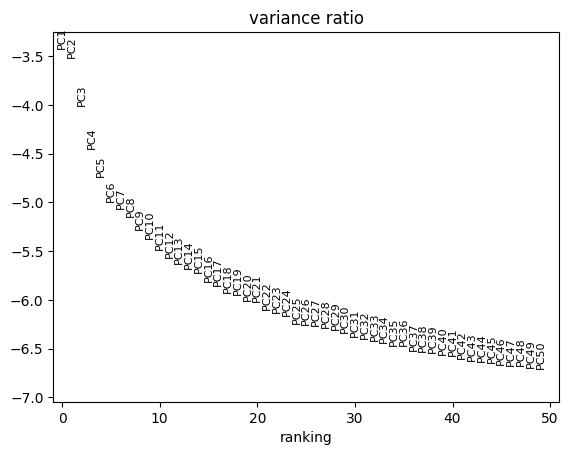

In [25]:
# make elbow plot to see variance contribution by each pc, choose inflection point
sc.pl.pca_variance_ratio(data, log=True, n_pcs=50)

### BBKNN Integration: 

In [26]:
sce.pp.bbknn(data, batch_key='integration_id')  

In [27]:
data.obsm

AxisArrays with keys: X_pca

#### No longer need neighbors step (bbknn replaces this)

### UMAP:

In [28]:
sc.tl.umap(data, min_dist=0.3) 

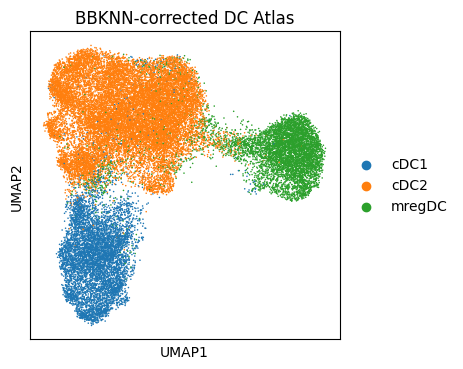

In [29]:
#plotting DC map
with plt.rc_context({"figure.figsize": (4, 4)}):
    sc.pl.umap(data, color=["NR_annotations_simple"], ncols=1, size=5, title='BBKNN-corrected DC Atlas')

In [30]:
custom_palette = [
    "#C53A32",  # cDC1
    "#9E47F3",  # cDC2
    "#84594F",  # mregDC
]

In [31]:
sc.set_figure_params(dpi=100, dpi_save=700, vector_friendly=True, format='svg')

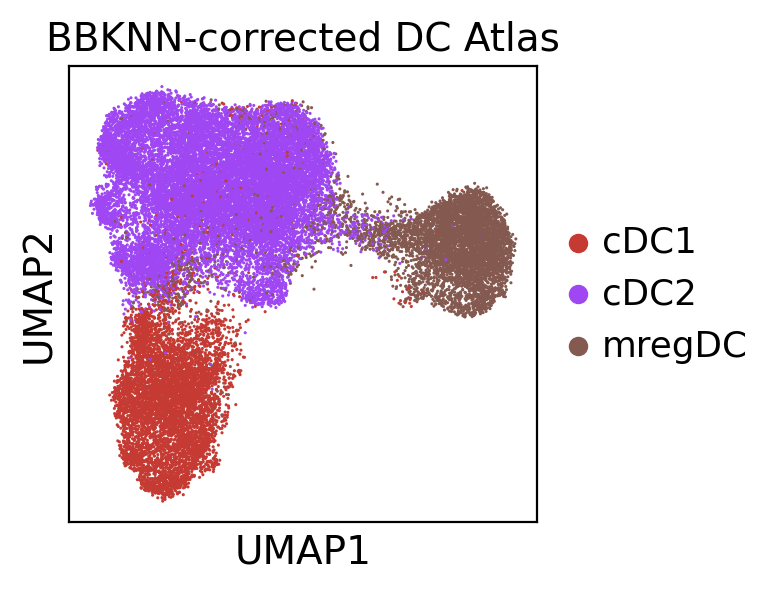

In [32]:
#plotting DC map
with plt.rc_context({"figure.figsize": (3, 3)}):
    sc.pl.umap(data, color=["NR_annotations_simple"], ncols=1, size=5, title='BBKNN-corrected DC Atlas', palette=custom_palette)

# Harmony Integration:

In [46]:
sce.pp.harmony_integrate(data, 'integration_id', max_iter_harmony=200, verbose=True)

2025-06-16 16:23:15,306 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2025-06-16 16:23:19,807 - harmonypy - INFO - sklearn.KMeans initialization complete.
2025-06-16 16:23:20,032 - harmonypy - INFO - Iteration 1 of 200
2025-06-16 16:24:55,256 - harmonypy - INFO - Iteration 2 of 200
2025-06-16 16:26:30,405 - harmonypy - INFO - Iteration 3 of 200
2025-06-16 16:27:59,866 - harmonypy - INFO - Iteration 4 of 200
2025-06-16 16:29:25,132 - harmonypy - INFO - Iteration 5 of 200
2025-06-16 16:30:51,110 - harmonypy - INFO - Iteration 6 of 200
2025-06-16 16:32:10,669 - harmonypy - INFO - Iteration 7 of 200
2025-06-16 16:33:35,932 - harmonypy - INFO - Iteration 8 of 200
2025-06-16 16:34:54,371 - harmonypy - INFO - Iteration 9 of 200
2025-06-16 16:36:11,601 - harmonypy - INFO - Iteration 10 of 200
2025-06-16 16:37:28,917 - harmonypy - INFO - Iteration 11 of 200
2025-06-16 16:38:46,053 - harmonypy - INFO - Converged after 11 iterations


In [47]:
data.obsm

AxisArrays with keys: X_pca, X_pca_harmony

In [48]:
#check made new column with adjusted harmony PCs
'X_pca_harmony' in data.obsm

True

In [49]:
#assign the new PCs to the standard PCA slot for post int
data.obsm['X_pca'] = data.obsm['X_pca_harmony']

In [51]:
## Computing neighbourhood graph - here UMAP
sc.pp.neighbors(data, n_neighbors=10, n_pcs=50)

In [52]:
sc.tl.umap(data, min_dist=0.3)  # 0.3 is personal preference

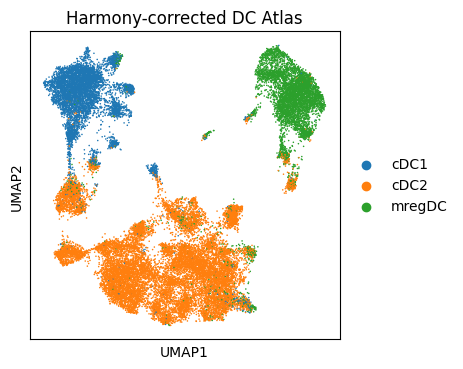

In [53]:
#plotting DC map
with plt.rc_context({"figure.figsize": (4, 4)}):
    sc.pl.umap(data, color=["NR_annotations_simple"], ncols=1, size=5, title='Harmony-corrected DC Atlas')

## When data is subsetted (to all DC or cDC2) Harmony seems to granulate the data, therefore, using bbknn for visualisation

# Using bbknn map:

### Overlay gene sets:

In [4]:
#define DC subset gene sets from Villani et al 
DC1_sig = ['CLEC9A','C1ORF54','HLA-DPA1','CADM1','CAMK2D','CPVL','HLA-DPB2','WDFY4','CPNE3','IDO1','HLA-DPB1','LOC645638','HLA-DOB','HLA-DQB1','HLA-DQB','CLNK','CSRP1','SNX3','ZNF366','KIAA1598','NDRG2','ENPP1','RGS10','AX747832','CYB5R3','ID2','XCR1','FAM190A','ASAP1','SLAMF8','CD59','DHRS3','GCET2','FNBP1','TMEM14A','NET1','BTLA','BCL6','FLT3','ADAM28','SLAMF7','BATF3','LGALS2','VAC14','PPA1','APOL3','C1ORF21','CCND1','ANPEP','ELOVL5','NCALD','ACTN1','PIK3CB','HAVCR2','GYPC','TLR10','ASB2','KIF16B','LRRC18','DST','DENND1B','DNASE1L3','SLC24A4','VAV3','THBD','NAV1','GSTM4','TRERF1','B3GNT7','LACC1','LMNA','PTK2','IDO2','MTERFD3','CD93','DPP4','SLC9A9','FCRL6','PDLIM7','CYP2E1','PDE4DIP','LIMA1','CTTNBP2NL','PPM1M','OSBPL3','PLCD1','CD38','EHD4','ACSS2','LOC541471','FUCA1','SNX22','APOL1','DUSP10','FAM160A2','INF2','DUSP2','PALM2','RAB11FIP4','DSE','FAM135A','KCNK6','PPM1H','PAFAH1B3','PDLIM1','TGM2','SCARF1','CD40','STX3','WHAMMP3','PRELID2','PQLC2']
DC2_sig = ['CD1C','FCER1A','CLEC10A','ADAM8','CD1D','FCGR2B','CLEC4A','SLC2A3','CD33','ETS2','CLIC2','PEA15','CACNA2D3','CD1E','MBOAT7','C10ORF128','NR4A2','AGPAT9','ENTPD1','CD2','PER1','PID1','AREG','PTGS1','SMA','CLEC17A','ITGA5','CREB5','PTAFR','NOD2','CCR6']
DC3_sig = ['S100A9','S100A8','VCAN','LYZ','ANXA1','PLBD1','RNASE2','FCER1A','SLC2A3','CD163','CSF3R','MNDA','CD14','NAIP','CSTA','FCN1','CD1D','FPR1','F13A1','CLEC10A','CES1','PID1','S100A12','MTMR11','SMA','LAT2','RETN','TMEM173','AOAH','RAB3D','CD36','MGST1','TREM1','HNMT','CES1P1','ADAM15','IL13RA1','MICAL2','ITGA5','CREB5','IL1B','NR4A2','MPP7','PTAFR','HBEGF','NFE2','ASGR1','BST1','IL1RN','NOD2','NLRP3','DQ575504','LMNA','C9ORF89','IL27RA','NLRP12','RAB27A','EREG','LOC284454']

#mregDC sig from Merad
mregDC_sig = ['CD40','CD80','CD86','RELB','CD83','CD274','PDCD1LG2','CD200','FAS','ALDH1A2','SOCS1','SOCS2','CCR7','MYO1G','CXCL16','ADAM8','ICAM1','FSCN1','MARCKS','MARCKSL1','IL4RA','IL4I1','CCL17','CCL22','TNFRSF4','STAT6','BCL2L1']

In [5]:
# Define dictionary of gene sets
gene_sets = {
    "DC1_sig": DC1_sig,
    "DC2_sig": DC2_sig,
    "DC3_sig": DC3_sig,
    "mregDC_sig": mregDC_sig
}

In [6]:
# Loop through each gene set and calculate the scores
for name, genes in gene_sets.items():
    sc.tl.score_genes(data, genes, score_name=name)

       'FAM190A', 'GCET2', 'C1ORF21', 'LRRC18', 'MTERFD3', 'LOC541471',
       'PALM2', 'WHAMMP3', 'PQLC2'],
      dtype='object')


In [36]:
colour_vars = ["DC1_sig","DC2_sig","DC3_sig","mregDC_sig","NR_annotations_simple"]

In [37]:
titles=['cDC1 Score (Villani et al. 2017)','cDC2 Score (Villani et al. 2017)','DC3 Score (Villani et al. 2017)', 'mregDC Score (Maier et al. 2020)', 'DC Annotations']

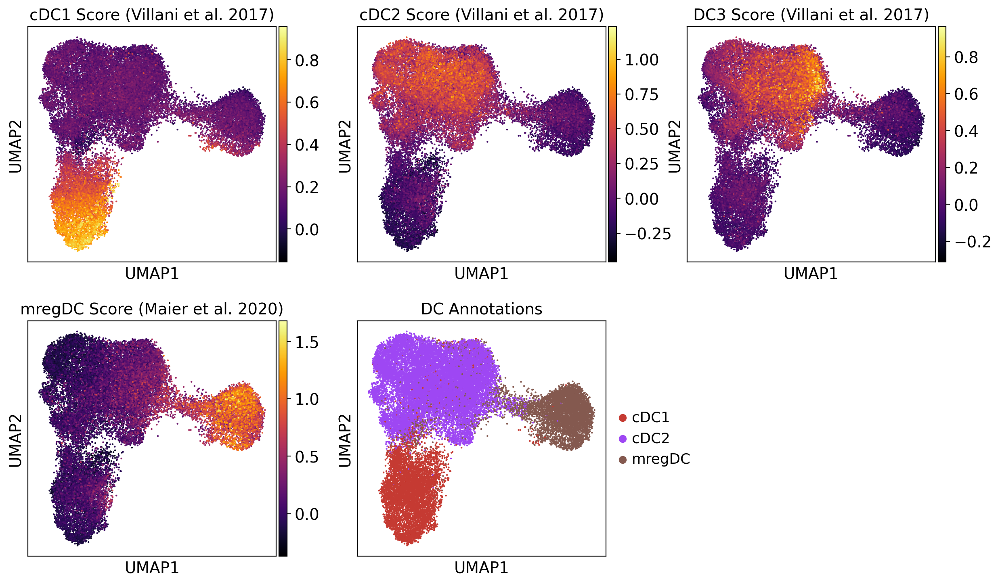

In [38]:
#plotting 
with plt.rc_context({"figure.figsize": (4, 4)}):
    sc.pl.umap(data, color=colour_vars, ncols=3, size=10, title=titles, cmap='inferno', palette=custom_palette, save="_DC-only_Clusters_Overlay.svg")

In [ ]:
# Export enrichment scores for plotting in prism (to do stats to add to plots below)
DC_score_df = data.obs[[
    'DC1_sig', 'DC2_sig', 'DC3_sig', 'mregDC_sig',
    'NR_annotations_simple',
    'integration_id'
]].copy()

# Save to CSV
DC_score_df.to_csv("DC_Sigs_enrichment_DC_only.csv", index=False)

In [10]:
DC_score_df.head()

,DC1_sig,DC2_sig,DC3_sig,mregDC_sig,NR_annotations_simple,integration_id
GSE215120_AM1_AAATGCCCAGAGCCAA-1,0.156292,0.287212,0.462408,0.363655,cDC2,GSE215120_Acral_MEL_AM1
GSE215120_AM1_ACACTGATCCACTGGG-1,0.189227,0.262973,0.329305,0.540091,cDC2,GSE215120_Acral_MEL_AM1
GSE215120_AM1_ACAGCCGCAAACCTAC-1,0.135271,0.039881,0.149325,0.032115,cDC2,GSE215120_Acral_MEL_AM1
GSE215120_AM1_ACCAGTAAGACTGGGT-1,0.367219,-0.123740,0.004747,0.273282,cDC1,GSE215120_Acral_MEL_AM1
GSE215120_AM1_ACGTCAACAAGGACTG-1,0.329010,-0.254166,0.017664,0.119234,cDC1,GSE215120_Acral_MEL_AM1


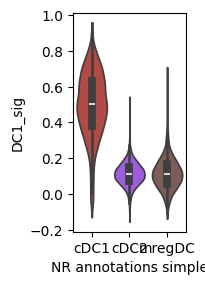

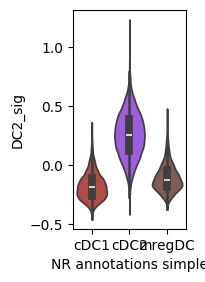

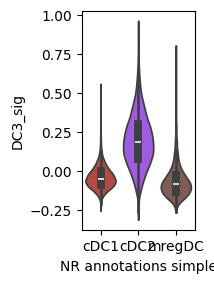

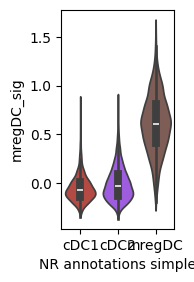

In [ ]:
# Plot violins
with plt.rc_context({"figure.figsize": (2.5, 3)}):
    for gene in gene_sets.keys():
        sc.pl.violin(
            data,
            keys=gene,
            groupby='NR_annotations_simple',
            stripplot=False,
            inner='box',
            show=True,  
            save=f"_DC_sigoverlay_Violin_{gene}.svg"
        )

In [39]:
#calculate DEG genes:
sc.tl.rank_genes_groups(data, groupby="NR_annotations_simple", method="wilcoxon")

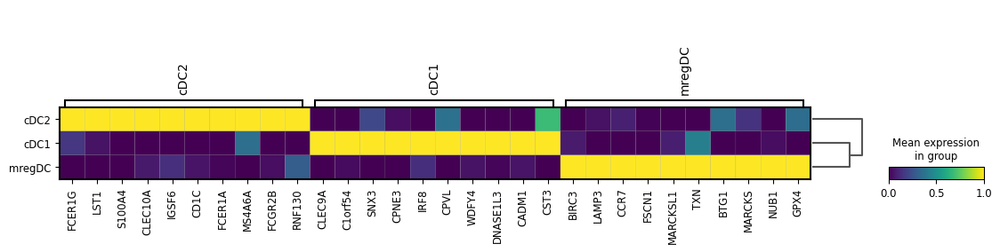

In [20]:
# visualise the top 10 DEG genes
sc.tl.dendrogram(data, groupby="NR_annotations_simple")
sc.pl.rank_genes_groups_matrixplot(data, groupby="NR_annotations_simple", standard_scale="var", n_genes=10, min_logfoldchange=1, save="_DC-only_DEGS.pdf")

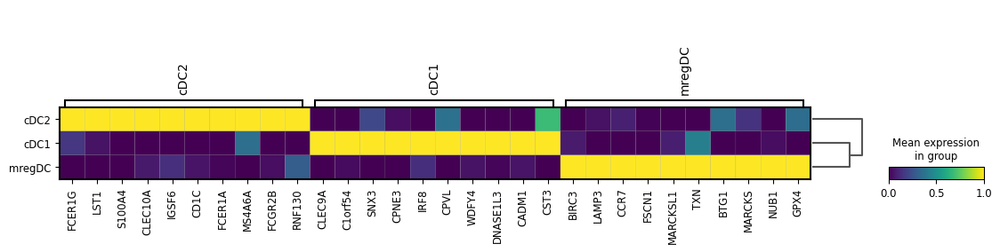

In [5]:
# visualise the top 10 DEG genes
sc.tl.dendrogram(data, groupby="NR_annotations_simple")
sc.pl.rank_genes_groups_matrixplot(data, groupby="NR_annotations_simple", standard_scale="var", n_genes=10, min_logfoldchange=1)

### export csv of degs:

In [13]:
# read out for each cell type
DC1_DEGS = sc.get.rank_genes_groups_df(data, group="cDC1")
DC2_DEGS = sc.get.rank_genes_groups_df(data, group="cDC2")
mreg_DEGS = sc.get.rank_genes_groups_df(data, group="mregDC")

In [14]:
# change any p values that are 0.0 to 1e-307 (smallest number excel can display)
min_float = 1e-307
DC1_DEGS['pvals'] = DC1_DEGS['pvals'].replace(0.0, min_float)
DC1_DEGS['pvals_adj'] = DC1_DEGS['pvals_adj'].replace(0.0, min_float)
DC2_DEGS['pvals'] = DC2_DEGS['pvals'].replace(0.0, min_float)
DC2_DEGS['pvals_adj'] = DC2_DEGS['pvals_adj'].replace(0.0, min_float)
mreg_DEGS['pvals'] = mreg_DEGS['pvals'].replace(0.0, min_float)
mreg_DEGS['pvals_adj'] = mreg_DEGS['pvals_adj'].replace(0.0, min_float)

In [15]:
# save degs
DC1_DEGS.to_csv("DEGs_cDC1_20250729.csv", index=False)
DC2_DEGS.to_csv("DEGs_cDC2_20250729.csv", index=False)
mreg_DEGS.to_csv("DEGs_mregDC_20250729.csv", index=False)

In [42]:
# export object: 
data.write_h5ad("20250617_AllDC_bbknn.h5ad", compression="gzip")

# Figures for manuscript: 

In [5]:
os.chdir('/scratch/user/s4436039/scdata/Myeloid_Objects/Manuscript_figures_20250722')
os.getcwd()

'/scratch/user/s4436039/scdata/Myeloid_Objects/Manuscript_figures_20250722'

In [21]:
sc.set_figure_params(dpi=100, dpi_save=700, vector_friendly=True, format='svg') #only run when exporting umaps

In [13]:
print(data.uns["NR_annotations_simple_colors"])

['#c53a32' '#9e47f3' '#84594f']


In [6]:
# Set colours for NR_annotations_simple plot:
data.uns["NR_annotations_simple_colors"] = ['#e377c2', '#aa40fc', '#8c564b']  

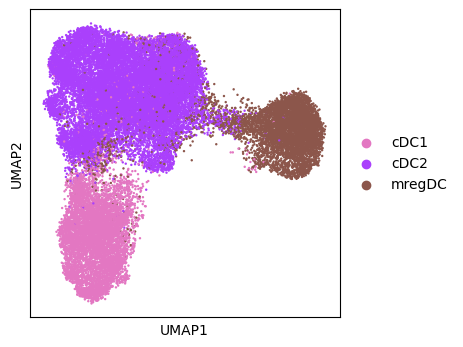

In [7]:
#export high res umap
with plt.rc_context({"figure.figsize": (4, 4)}):
    sc.pl.umap(data, 
               color="NR_annotations_simple", 
               size=12,
               title="")

### Overlay gene sets:

In [9]:
#define DC subset gene sets from Villani et al 
DC1_sig = ['CLEC9A','C1ORF54','HLA-DPA1','CADM1','CAMK2D','CPVL','HLA-DPB2','WDFY4','CPNE3','IDO1','HLA-DPB1','LOC645638','HLA-DOB','HLA-DQB1','HLA-DQB','CLNK','CSRP1','SNX3','ZNF366','KIAA1598','NDRG2','ENPP1','RGS10','AX747832','CYB5R3','ID2','XCR1','FAM190A','ASAP1','SLAMF8','CD59','DHRS3','GCET2','FNBP1','TMEM14A','NET1','BTLA','BCL6','FLT3','ADAM28','SLAMF7','BATF3','LGALS2','VAC14','PPA1','APOL3','C1ORF21','CCND1','ANPEP','ELOVL5','NCALD','ACTN1','PIK3CB','HAVCR2','GYPC','TLR10','ASB2','KIF16B','LRRC18','DST','DENND1B','DNASE1L3','SLC24A4','VAV3','THBD','NAV1','GSTM4','TRERF1','B3GNT7','LACC1','LMNA','PTK2','IDO2','MTERFD3','CD93','DPP4','SLC9A9','FCRL6','PDLIM7','CYP2E1','PDE4DIP','LIMA1','CTTNBP2NL','PPM1M','OSBPL3','PLCD1','CD38','EHD4','ACSS2','LOC541471','FUCA1','SNX22','APOL1','DUSP10','FAM160A2','INF2','DUSP2','PALM2','RAB11FIP4','DSE','FAM135A','KCNK6','PPM1H','PAFAH1B3','PDLIM1','TGM2','SCARF1','CD40','STX3','WHAMMP3','PRELID2','PQLC2']
DC2_sig = ['CD1C','FCER1A','CLEC10A','ADAM8','CD1D','FCGR2B','CLEC4A','SLC2A3','CD33','ETS2','CLIC2','PEA15','CACNA2D3','CD1E','MBOAT7','C10ORF128','NR4A2','AGPAT9','ENTPD1','CD2','PER1','PID1','AREG','PTGS1','SMA','CLEC17A','ITGA5','CREB5','PTAFR','NOD2','CCR6']
DC3_sig = ['S100A9','S100A8','VCAN','LYZ','ANXA1','PLBD1','RNASE2','FCER1A','SLC2A3','CD163','CSF3R','MNDA','CD14','NAIP','CSTA','FCN1','CD1D','FPR1','F13A1','CLEC10A','CES1','PID1','S100A12','MTMR11','SMA','LAT2','RETN','TMEM173','AOAH','RAB3D','CD36','MGST1','TREM1','HNMT','CES1P1','ADAM15','IL13RA1','MICAL2','ITGA5','CREB5','IL1B','NR4A2','MPP7','PTAFR','HBEGF','NFE2','ASGR1','BST1','IL1RN','NOD2','NLRP3','DQ575504','LMNA','C9ORF89','IL27RA','NLRP12','RAB27A','EREG','LOC284454']

#mregDC sig from Maier et al 
mregDC_sig = ['CD40','CD80','CD86','RELB','CD83','CD274','PDCD1LG2','CD200','FAS','ALDH1A2','SOCS1','SOCS2','CCR7','MYO1G','CXCL16','ADAM8','ICAM1','FSCN1','MARCKS','MARCKSL1','IL4RA','IL4I1','CCL17','CCL22','TNFRSF4','STAT6','BCL2L1']

# overlay Moon et al 2025 sigs
Moon_CD207_sig = ['CD1A','CD207','FCGBP','LTB','SPI1','S100B'] 
Moon_ISG_sig = ['ISG15', 'ISG20', 'CXCL9', 'CXCL10', 'IFIT1', 'IFIT3', 'IFI6', 'GBP2']

In [10]:
# Define dictionary of gene sets
gene_sets = {
    "DC1_sig": DC1_sig,
    "DC2_sig": DC2_sig,
    "DC3_sig": DC3_sig,
    "mregDC_sig": mregDC_sig,
    "Moon_CD207_sig": Moon_CD207_sig,
    "Moon_ISG_sig": Moon_ISG_sig
}

In [11]:
# Loop through each gene set and calculate the scores
for name, genes in gene_sets.items():
    sc.tl.score_genes(data, genes, score_name=name)

       'FAM190A', 'GCET2', 'C1ORF21', 'LRRC18', 'MTERFD3', 'LOC541471',
       'PALM2', 'WHAMMP3', 'PQLC2'],
      dtype='object')


In [22]:
colour_vars = ["DC1_sig","DC2_sig","DC3_sig","mregDC_sig","Moon_CD207_sig","Moon_ISG_sig","NR_annotations_simple"]

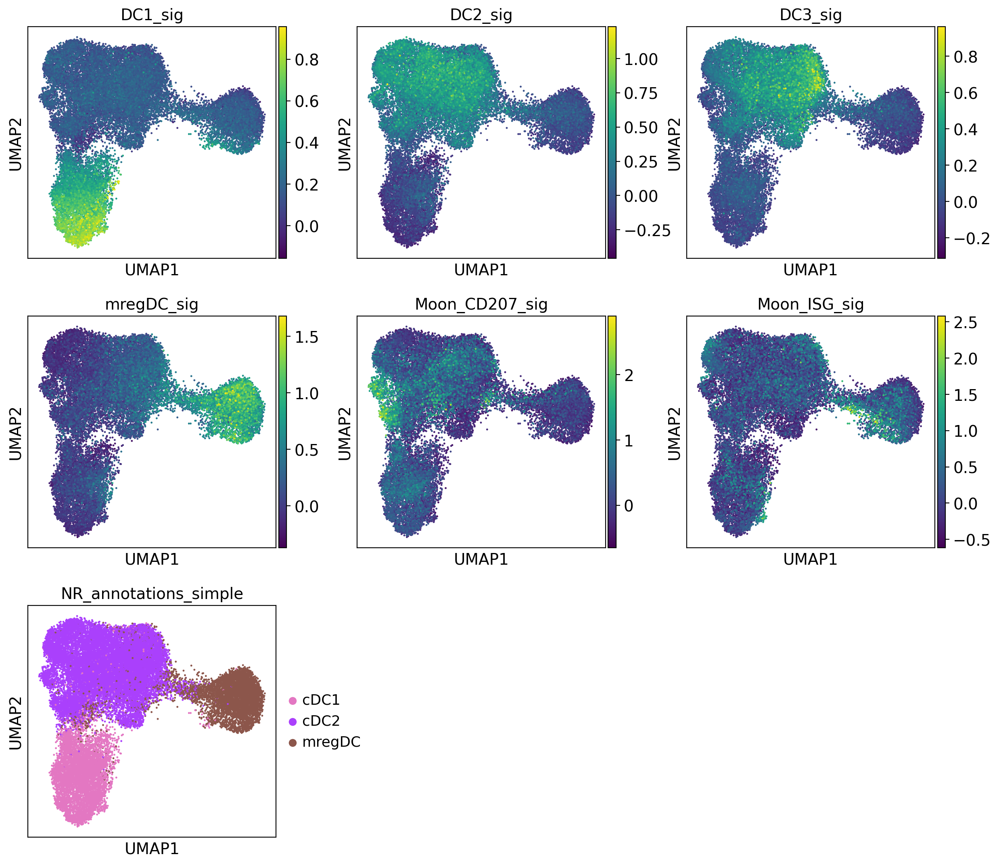

In [23]:
#plotting 
with plt.rc_context({"figure.figsize": (4, 4)}):
    sc.pl.umap(data, color=colour_vars, ncols=3, size=12, save="_DC_sig_Overlays.pdf")

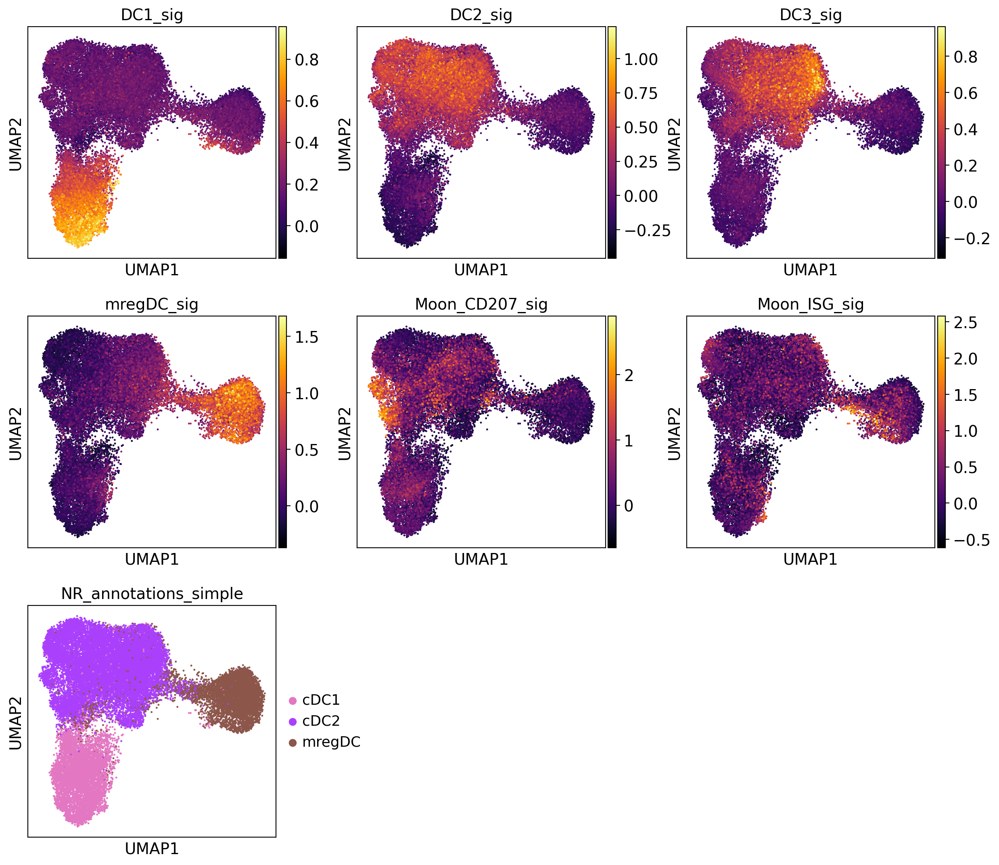

In [21]:
#plotting 
with plt.rc_context({"figure.figsize": (4, 4)}):
    sc.pl.umap(data, color=colour_vars, ncols=3, size=12, cmap='inferno')

In [26]:
# Export enrichment scores for plotting in prism (to do stats to add to plots below)
DC_score_df = data.obs[[
    'DC1_sig', 'DC2_sig', 'DC3_sig', 'mregDC_sig','Moon_CD207_sig','Moon_ISG_sig',
    'NR_annotations_simple',
    'integration_id'
]].copy()

# Save to CSV
DC_score_df.to_csv("DC_Sigs_enrichment_scores_DC_only.csv", index=False)

In [27]:
DC_score_df.head()

,DC1_sig,DC2_sig,DC3_sig,mregDC_sig,Moon_CD207_sig,Moon_ISG_sig,NR_annotations_simple,integration_id
GSE215120_AM1_AAATGCCCAGAGCCAA-1,0.156292,0.287212,0.462408,0.363655,-0.234022,0.055226,cDC2,GSE215120_Acral_MEL_AM1
GSE215120_AM1_ACACTGATCCACTGGG-1,0.189227,0.262973,0.329305,0.540091,-0.174383,0.812555,cDC2,GSE215120_Acral_MEL_AM1
GSE215120_AM1_ACAGCCGCAAACCTAC-1,0.135271,0.039881,0.149325,0.032115,-0.367575,0.752313,cDC2,GSE215120_Acral_MEL_AM1
GSE215120_AM1_ACCAGTAAGACTGGGT-1,0.367219,-0.123740,0.004747,0.273282,-0.084383,0.284065,cDC1,GSE215120_Acral_MEL_AM1
GSE215120_AM1_ACGTCAACAAGGACTG-1,0.329010,-0.254166,0.017664,0.119234,-0.014712,0.287628,cDC1,GSE215120_Acral_MEL_AM1


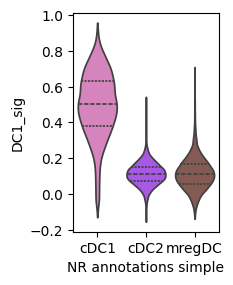

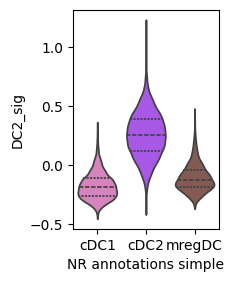

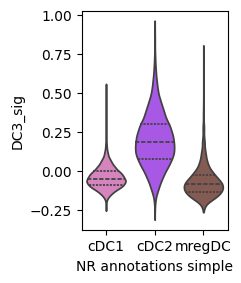

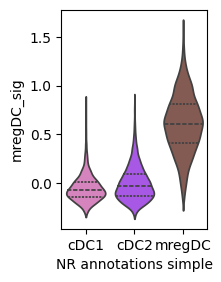

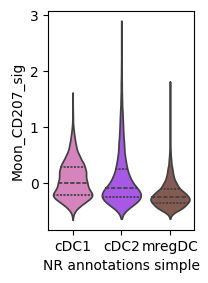

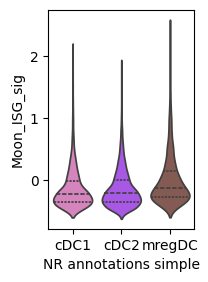

In [19]:
# Plot violins
with plt.rc_context({"figure.figsize": (2.8, 3)}):
    for gene in gene_sets.keys():
        sc.pl.violin(
            data,
            keys=gene,
            groupby='NR_annotations_simple',
            stripplot=False,
            inner='quartiles',
            show=True,  
            save=f"_DC_sigoverlay_Violin_{gene}.pdf"
        )

# Check if CD207/CD1A higher in DC in melanoma

In [3]:
# read in data
data = sc.read_h5ad('20250617_AllDC_bbknn.h5ad')

In [4]:
#subset to primary samples
data_P = data[data.obs["sample_type_major2"].isin(["primary tumour"])]

In [5]:
#define DC subset gene sets from Villani et al 
LC_sig = ['CD207','CD1A']

In [6]:
# Define dictionary of gene sets
gene_sets = {
    "LC_score": LC_sig,
}

In [7]:
# Loop through each gene set and calculate the scores
for name, genes in gene_sets.items():
    sc.tl.score_genes(data_P, genes, score_name=name)

/home/s4436039/miniforge3/envs/env/lib/python3.12/site-packages/scanpy/tools/_score_genes.py:176: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.


In [8]:
# extract data
df = data_P.obs[["LC_score", "NR_annotations_simple", "cancer_broadest"]].copy()

In [9]:
# calculate mean LC_score
heatmap_df = (
    df.groupby(["NR_annotations_simple", "cancer_broadest"])["LC_score"]
    .mean()
    .unstack()  # makes cancer_broadest columns, NR_annotations_simple rows
)

/scratch/temp/14490072/ipykernel_2970685/3801329236.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


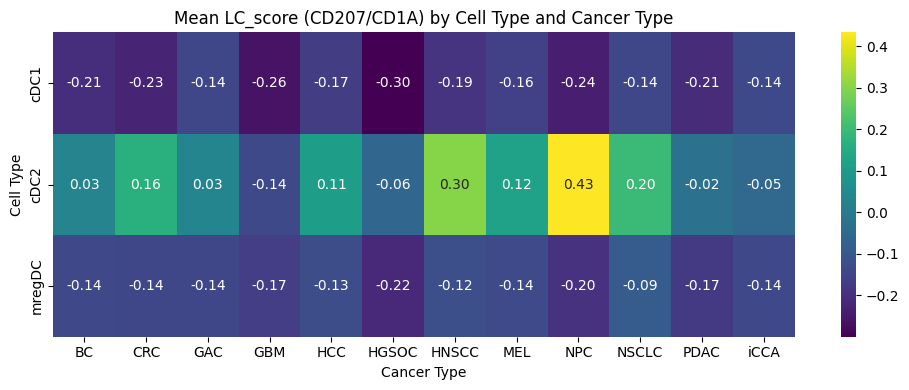

In [10]:
# plot
plt.figure(figsize=(10, 4))
sns.heatmap(heatmap_df, cmap="viridis", annot=True, fmt=".2f", cbar=True)

plt.title("Mean LC_score (CD207/CD1A) by Cell Type and Cancer Type")
plt.xlabel("Cancer Type")
plt.ylabel("Cell Type")
plt.tight_layout()
plt.show()

# Plot DC UMAP broken down by cancer type:

In [8]:
data

AnnData object with n_obs × n_vars = 29887 × 1746
    obs: 'nCount_RNA', 'nFeature_RNA', 'sample_type', 'cancer_type', 'patient_id', 'sample_id', 'percent.mt', 'site', 'sample_type_major', 'cancer_subtype', 'integration_id', 'ident', 'dataset_id', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'S_score', 'G2M_score', 'keep_or_remove', 'leiden', 'celltype', 'leiden_DC', 'leiden_DC_v2', 'exclude_annots', 'leiden_M', 'Technology', 'NR_annotations_simple', 'sample_type_major2', 'cancer_with_H', 'cancer_broadest', 'patient_treatment', 'DC1_sig', 'DC2_sig', 'DC3_sig', 'mregDC_sig'
    var: 'name', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions'

#### For the purpose of plotting (as get error if a category is NA) change all the NA values in cancer_broadest to "healthy"


In [7]:
print(data.obs["cancer_broadest"].unique())

['MEL', 'BC', 'HNSCC', 'NSCLC', 'NA', ..., 'GBM', 'GAC', 'HCC', 'iCCA', 'NPC']
Length: 13
Categories (13, object): ['BC', 'CRC', 'GAC', 'GBM', ..., 'NPC', 'NSCLC', 'PDAC', 'iCCA']


In [9]:
data.obs["cancer_broadest"] = data.obs["cancer_broadest"].replace("NA", "Healthy")

/scratch/temp/14501534/ipykernel_1825058/904809493.py:1: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.


In [10]:
custom_colours = ["#1D1F57", "#1D1F57", "#1D1F57","#1D1F57","#1D1F57", "#1D1F57","#1D1F57", "#1D1F57","#1D1F57", "#1D1F57","#1D1F57", "#1D1F57", "#1D1F57"] 

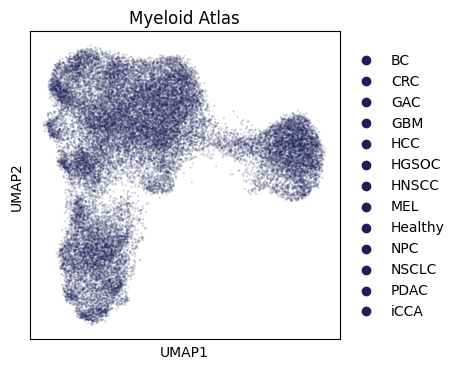

In [11]:
with plt.rc_context({"figure.figsize": (4, 4)}):
    sc.pl.umap(data, color="cancer_broadest", size=10, title="Myeloid Atlas", alpha=0.2, palette=custom_colours)

In [12]:
# set working directory where I want to save figures
os.chdir('/scratch/user/s4436039/scdata/DC_Visualise')

In [13]:
sc.set_figure_params(dpi=80, dpi_save=700, vector_friendly=True, format='svg')

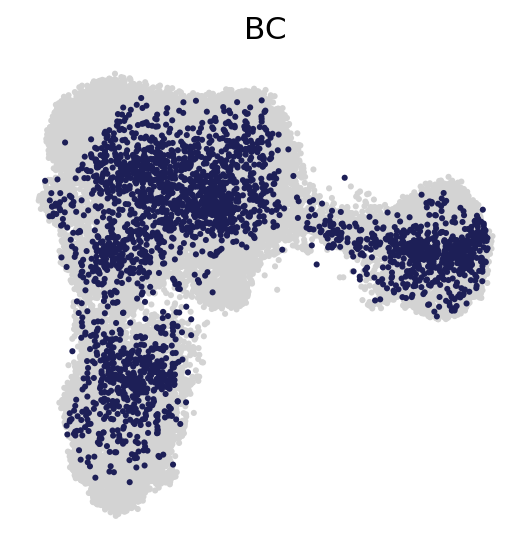

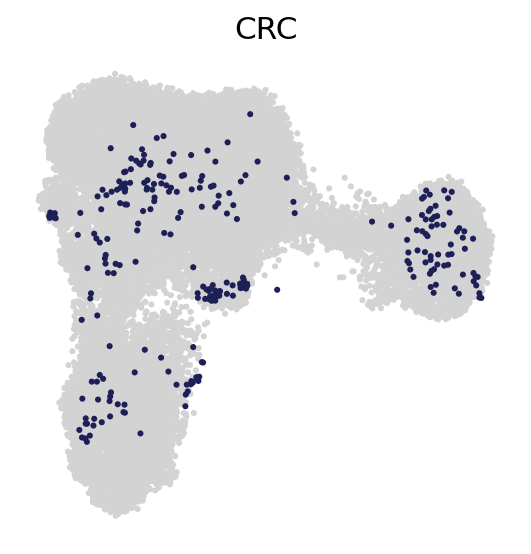

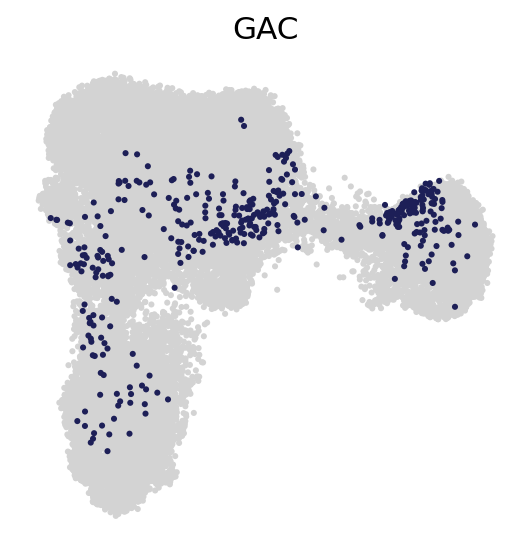

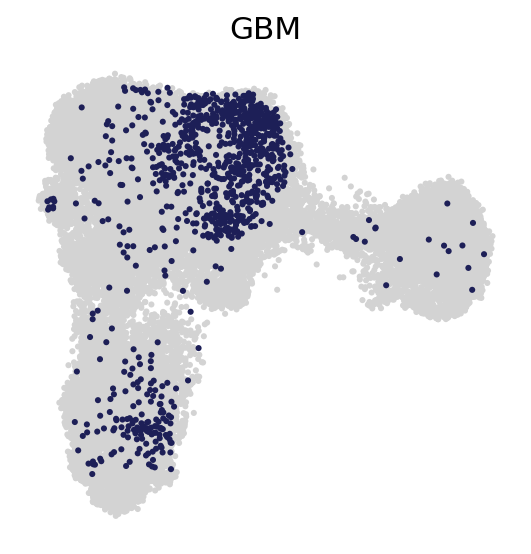

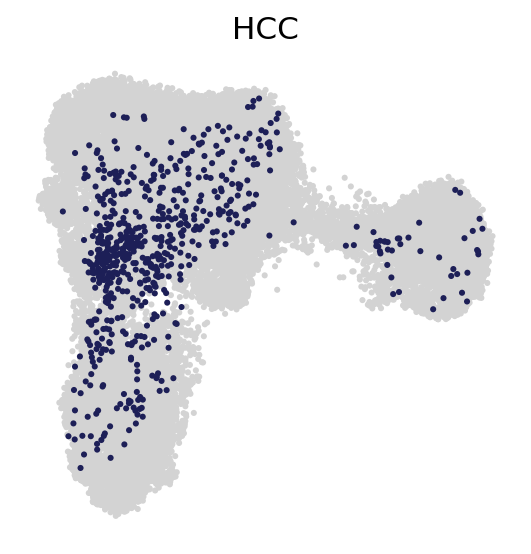

...

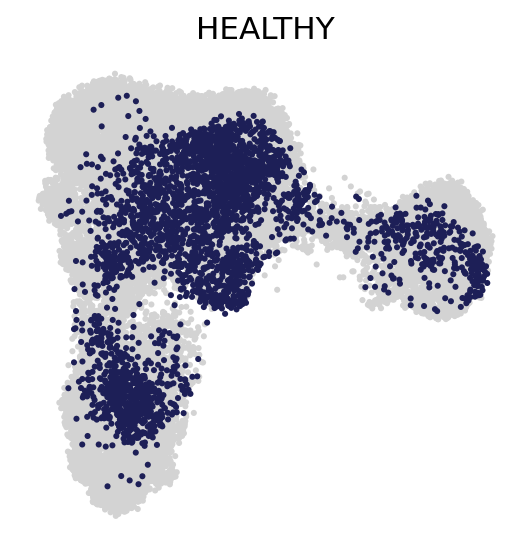

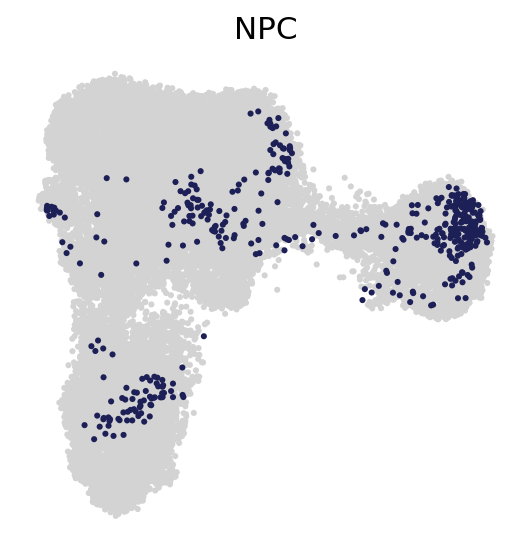

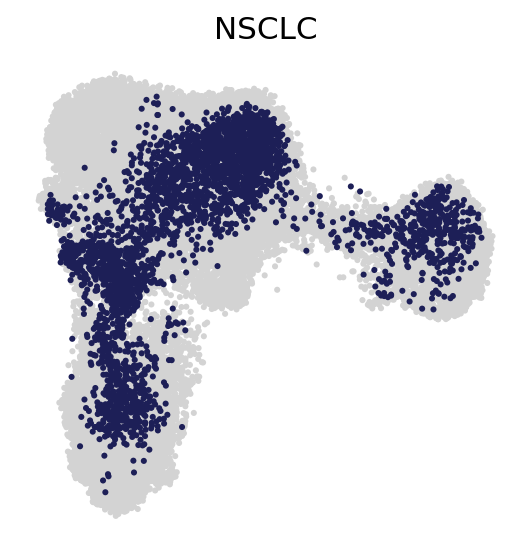

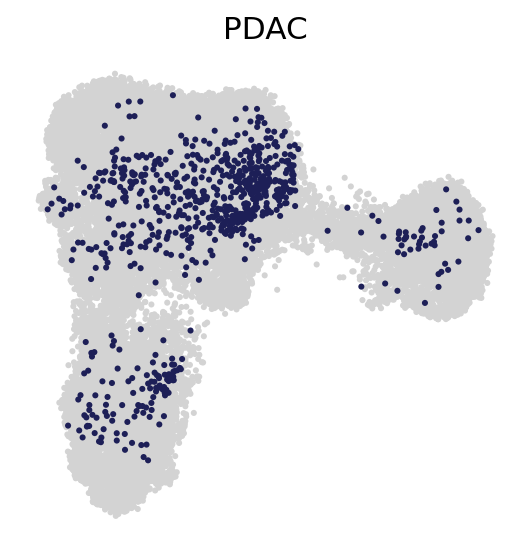

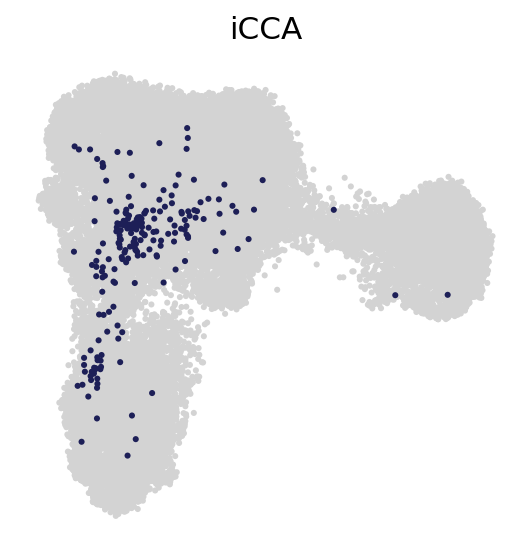

In [14]:
with plt.rc_context({"figure.figsize": (4, 4)}):
    sc.pl.umap(data, color="cancer_broadest", groups=["BC"], size=30, title="BC", palette=custom_colours, frameon=False, legend_loc=None, save="_BC.svg")
    sc.pl.umap(data, color="cancer_broadest", groups=["CRC"], size=30, title="CRC", palette=custom_colours, frameon=False, legend_loc=None, save="_CRC.svg")
    sc.pl.umap(data, color="cancer_broadest", groups=["GAC"], size=30, title="GAC", palette=custom_colours, frameon=False, legend_loc=None, save="_GAC.svg")
    sc.pl.umap(data, color="cancer_broadest", groups=["GBM"], size=30, title="GBM", palette=custom_colours, frameon=False, legend_loc=None, save="_GBM.svg")
    sc.pl.umap(data, color="cancer_broadest", groups=["HCC"], size=30, title="HCC", palette=custom_colours, frameon=False, legend_loc=None, save="_HCC.svg")
    sc.pl.umap(data, color="cancer_broadest", groups=["HGSOC"], size=30, title="HGSOC", palette=custom_colours, frameon=False, legend_loc=None, save="_HGSOC.svg")
    sc.pl.umap(data, color="cancer_broadest", groups=["HNSCC"], size=30, title="HNSCC", palette=custom_colours, frameon=False, legend_loc=None, save="_HNSCC.svg")
    sc.pl.umap(data, color="cancer_broadest", groups=["MEL"], size=30, title="MEL", palette=custom_colours, frameon=False, legend_loc=None, save="_MEL.svg")
    sc.pl.umap(data, color="cancer_broadest", groups=["Healthy"], size=30, title="HEALTHY", palette=custom_colours, frameon=False, legend_loc=None, save="_Healthy.svg")
    sc.pl.umap(data, color="cancer_broadest", groups=["NPC"], size=30, title="NPC", palette=custom_colours, frameon=False, legend_loc=None, save="_NPC.svg")
    sc.pl.umap(data, color="cancer_broadest", groups=["NSCLC"], size=30, title="NSCLC", palette=custom_colours, frameon=False, legend_loc=None, save="_NSCLC.svg")
    sc.pl.umap(data, color="cancer_broadest", groups=["PDAC"], size=30, title="PDAC", palette=custom_colours, frameon=False, legend_loc=None, save="_PDAC.svg")
    sc.pl.umap(data, color="cancer_broadest", groups=["iCCA"], size=30, title="iCCA", palette=custom_colours, frameon=False, legend_loc=None, save="_iCCA.svg")

# Overlaying signatures from Moon et al 2025:

In [3]:
# read in data
data = sc.read_h5ad('20250617_AllDC_bbknn.h5ad')

In [4]:
# overlay Moon et al 2025 sigs
DC_CD207 = ['CD1A','CD207','FCGBP','LTB','SPI1','S100B'] 
DC_ISG = ['ISG15', 'ISG20', 'CXCL9', 'CXCL10', 'IFIT1', 'IFIT3', 'IFI6', 'GBP2']
DC_mregDC = ['CCR7','FSCN1','CD40','CD86','RELB','SOCS2','SOCS1','IL4I1','TNFRSF9','IDO1','BIRC2','BIRC3','FAS','MARCH1','CCL5','CCL17','CCL22','IL15','TAPBP','B2M']

In [5]:
# Define dictionary of gene sets
gene_sets = {
    "DC_CD207_sig": DC_CD207,
    "DC_ISG_sig": DC_ISG,
    "DC_mregDC_sig": DC_mregDC,
}

In [6]:
# Loop through each gene set and calculate the scores
for name, genes in gene_sets.items():
    sc.tl.score_genes(data, genes, score_name=name)

In [7]:
titles = ['CD207+ DC (Moon et al. 2025)','ISG+ DC (Moon et al. 2025)','mregDC (Moon et al. 2025)']

In [9]:
sc.set_figure_params(dpi=80, dpi_save=700, vector_friendly=True, format='svg')

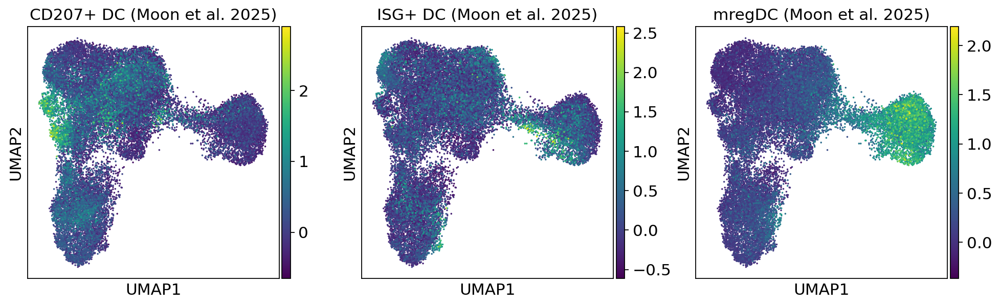

In [16]:
#plotting 
with plt.rc_context({"figure.figsize": (4, 4)}):
    sc.pl.umap(data, color=gene_sets, ncols=3, size=10, title=titles, save="_DC-only_Moon_sigs_Overlay.svg")

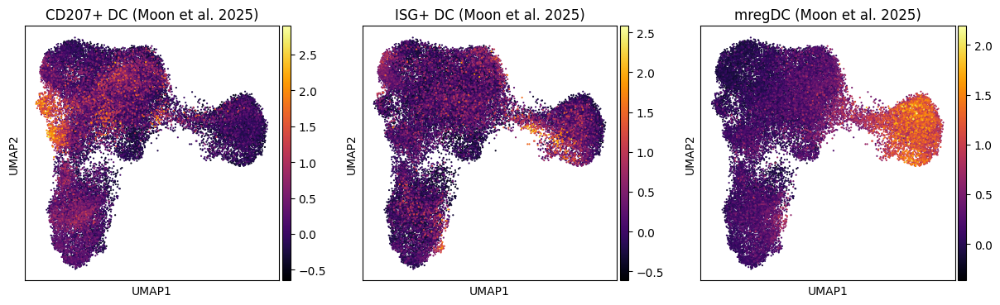

In [8]:
#plotting 
with plt.rc_context({"figure.figsize": (4, 4)}):
    sc.pl.umap(data, color=gene_sets, ncols=3, size=10, title=titles, cmap='inferno')

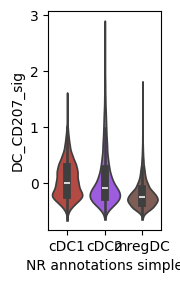

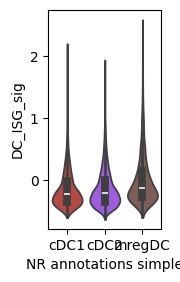

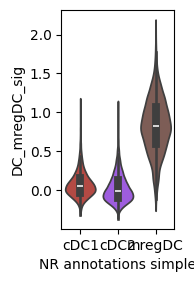

In [9]:
# Plot violins
with plt.rc_context({"figure.figsize": (2.5, 3)}):
    for gene in gene_sets.keys():
        sc.pl.violin(
            data,
            keys=gene,
            groupby='NR_annotations_simple',
            stripplot=False,
            inner='box',
            show=True
            #save=f"_DC_sigoverlay_Violin_{gene}.svg"
        )

# Investigate ISG signature by cancer type:

In [20]:
# Subset to only primary tumours
data_P = data[data.obs["sample_type_major2"].isin(["primary tumour"])]

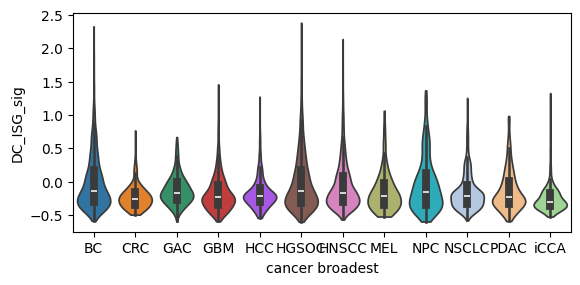

In [29]:
# Plot violin
with plt.rc_context({"figure.figsize": (6, 3)}):
        sc.pl.violin(
            data_P,
            keys="DC_ISG_sig",
            groupby='cancer_broadest',
            stripplot=False,
            inner='box',
            show=True  
            #save=f"_DC_sigoverlay_Violin_{gene}.svg"
        )

In [21]:
#Check cancer types in cancer_broadest
data_P.obs["cancer_broadest"].value_counts()

cancer_broadest
HNSCC    5912
NSCLC    3154
HGSOC    2541
BC       2182
GBM       949
HCC       656
NPC       460
PDAC      434
GAC       358
MEL       284
iCCA      206
CRC       200
Name: count, dtype: int64

In [22]:
# Make object for each cancer type
data_HNSCC = data[data.obs["cancer_broadest"].isin(["HNSCC"])]
data_NSCLC = data[data.obs["cancer_broadest"].isin(["NSCLC"])]
data_HGSOC = data[data.obs["cancer_broadest"].isin(["HGSOC"])]
data_BC = data[data.obs["cancer_broadest"].isin(["BC"])]
data_GBM = data[data.obs["cancer_broadest"].isin(["GBM"])]
data_HCC = data[data.obs["cancer_broadest"].isin(["HCC"])]
data_NPC = data[data.obs["cancer_broadest"].isin(["NPC"])]
data_PDAC = data[data.obs["cancer_broadest"].isin(["PDAC"])]
data_GAC = data[data.obs["cancer_broadest"].isin(["GAC"])]
data_MEL = data[data.obs["cancer_broadest"].isin(["MEL"])]
data_iCCA = data[data.obs["cancer_broadest"].isin(["iCCA"])]
data_CRC = data[data.obs["cancer_broadest"].isin(["CRC"])]

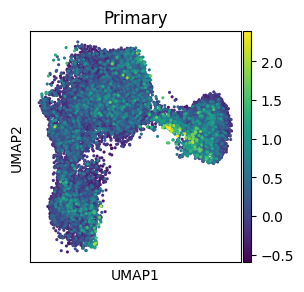

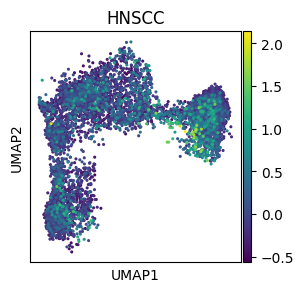

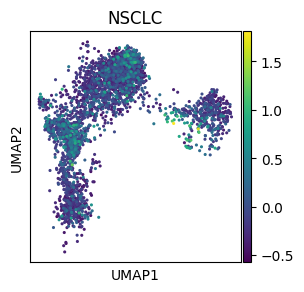

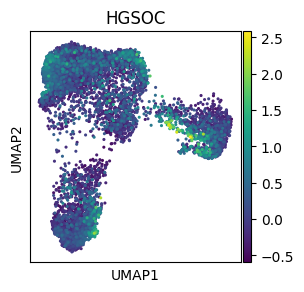

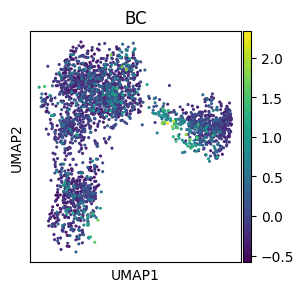

...

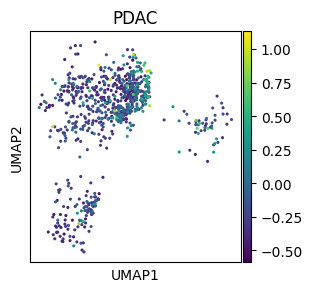

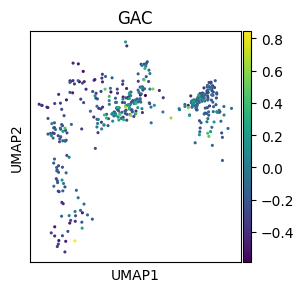

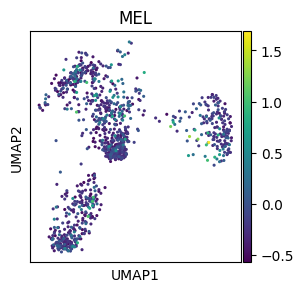

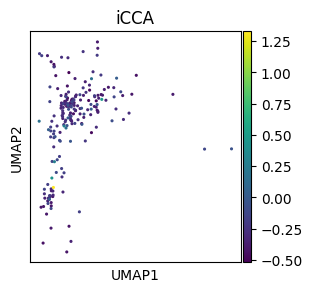

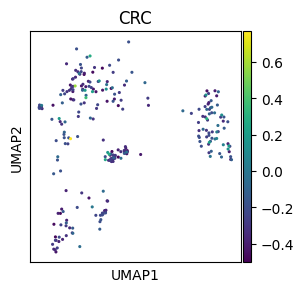

In [26]:
#plotting 
with plt.rc_context({"figure.figsize": (3, 3)}):
    sc.pl.umap(data_P, color="DC_ISG_sig", ncols=1, size=20, title="Primary")
    sc.pl.umap(data_HNSCC, color="DC_ISG_sig", ncols=1, size=20, title="HNSCC")
    sc.pl.umap(data_NSCLC, color="DC_ISG_sig", ncols=1, size=20, title="NSCLC")
    sc.pl.umap(data_HGSOC, color="DC_ISG_sig", ncols=1, size=20, title="HGSOC")
    sc.pl.umap(data_BC, color="DC_ISG_sig", ncols=1, size=20, title="BC")
    sc.pl.umap(data_GBM, color="DC_ISG_sig", ncols=1, size=20, title="GBM")
    sc.pl.umap(data_HCC, color="DC_ISG_sig", ncols=1, size=20, title="HCC")
    sc.pl.umap(data_NPC, color="DC_ISG_sig", ncols=1, size=20, title="NPC")
    sc.pl.umap(data_PDAC, color="DC_ISG_sig", ncols=1, size=20, title="PDAC")
    sc.pl.umap(data_GAC, color="DC_ISG_sig", ncols=1, size=20, title="GAC")
    sc.pl.umap(data_MEL, color="DC_ISG_sig", ncols=1, size=20, title="MEL")
    sc.pl.umap(data_iCCA, color="DC_ISG_sig", ncols=1, size=20, title="iCCA")
    sc.pl.umap(data_CRC, color="DC_ISG_sig", ncols=1, size=20, title="CRC")

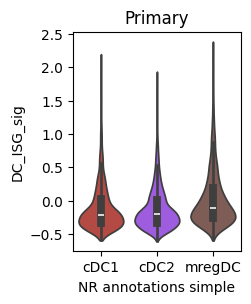

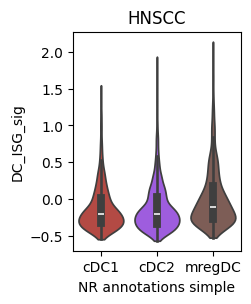

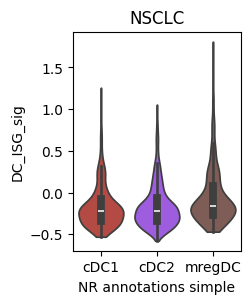

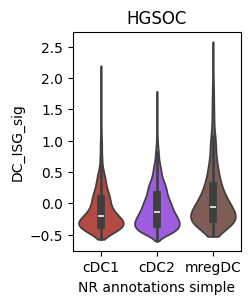

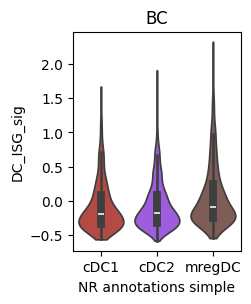

...

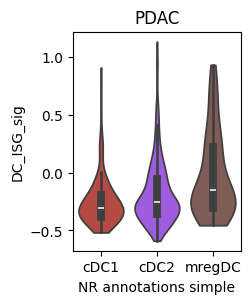

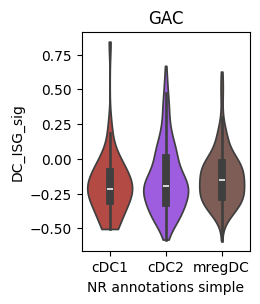

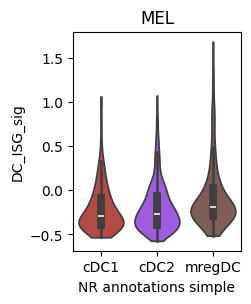

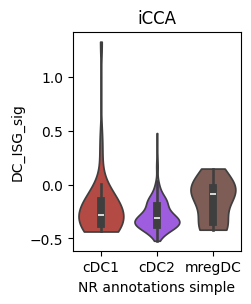

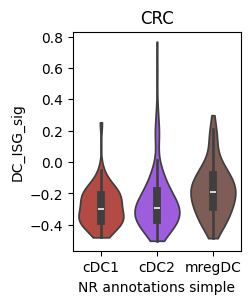

In [38]:
# Plot violin
with plt.rc_context({"figure.figsize": (3, 3)}):
    sc.pl.violin(data_P, keys="DC_ISG_sig", groupby='NR_annotations_simple', stripplot=False, inner='box', show=False)
    plt.title("Primary")
    plt.show()

    sc.pl.violin(data_HNSCC, keys="DC_ISG_sig", groupby='NR_annotations_simple', stripplot=False, inner='box', show=False)
    plt.title("HNSCC")
    plt.show()

    sc.pl.violin(data_NSCLC, keys="DC_ISG_sig", groupby='NR_annotations_simple', stripplot=False, inner='box', show=False)
    plt.title("NSCLC")
    plt.show()

    sc.pl.violin(data_HGSOC, keys="DC_ISG_sig", groupby='NR_annotations_simple', stripplot=False, inner='box', show=False)
    plt.title("HGSOC")
    plt.show()

    sc.pl.violin(data_BC, keys="DC_ISG_sig", groupby='NR_annotations_simple', stripplot=False, inner='box', show=False)
    plt.title("BC")
    plt.show()

    sc.pl.violin(data_GBM, keys="DC_ISG_sig", groupby='NR_annotations_simple', stripplot=False, inner='box', show=False)
    plt.title("GBM")
    plt.show()

    sc.pl.violin(data_HCC, keys="DC_ISG_sig", groupby='NR_annotations_simple', stripplot=False, inner='box', show=False)
    plt.title("HCC")
    plt.show()

    sc.pl.violin(data_NPC, keys="DC_ISG_sig", groupby='NR_annotations_simple', stripplot=False, inner='box', show=False)
    plt.title("NPC")
    plt.show()

    sc.pl.violin(data_PDAC, keys="DC_ISG_sig", groupby='NR_annotations_simple', stripplot=False, inner='box', show=False)
    plt.title("PDAC")
    plt.show()

    sc.pl.violin(data_GAC, keys="DC_ISG_sig", groupby='NR_annotations_simple', stripplot=False, inner='box', show=False)
    plt.title("GAC")
    plt.show()

    sc.pl.violin(data_MEL, keys="DC_ISG_sig", groupby='NR_annotations_simple', stripplot=False, inner='box', show=False)
    plt.title("MEL")
    plt.show()

    sc.pl.violin(data_iCCA, keys="DC_ISG_sig", groupby='NR_annotations_simple', stripplot=False, inner='box', show=False)
    plt.title("iCCA")
    plt.show()

    sc.pl.violin(data_CRC, keys="DC_ISG_sig", groupby='NR_annotations_simple', stripplot=False, inner='box', show=False)
    plt.title("CRC")
    plt.show()

# Comparing ISG Sigs:

In [4]:
Cheng_DC2_ISG15 = ['ISG15','IFI6','IFIT1','IFITM1','IFIT2'] 
Moon_DC_ISG = ['ISG15', 'ISG20', 'CXCL9', 'CXCL10', 'IFIT1', 'IFIT3', 'IFI6', 'GBP2']

In [5]:
# Define dictionary of gene sets
gene_sets = {
    "Cheng_DC2_ISG15_sig": Cheng_DC2_ISG15,
    "Moon_DC_ISG_sig": Moon_DC_ISG,
}

In [6]:
# Loop through each gene set and calculate the scores
for name, genes in gene_sets.items():
    sc.tl.score_genes(data, genes, score_name=name)

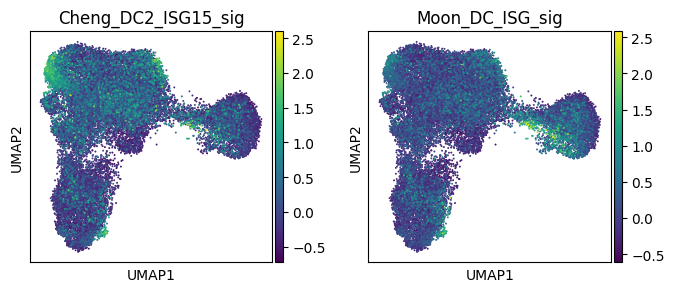

In [7]:
#plotting 
with plt.rc_context({"figure.figsize": (3, 3)}):
    sc.pl.umap(data, color=gene_sets, ncols=2, size=8)

# Overlaying Guimaraes DC_CXCL8 (CXCL2) Sig:

In [11]:
Gui_CXCL2 = ['CXCL8','CXCL2'] 

In [12]:
# Define dictionary of gene sets
gene_sets = {
    "Gui_CXCL2_sig": Gui_CXCL2,
}

In [13]:
# Loop through each gene set and calculate the scores
for name, genes in gene_sets.items():
    sc.tl.score_genes(data, genes, score_name=name)

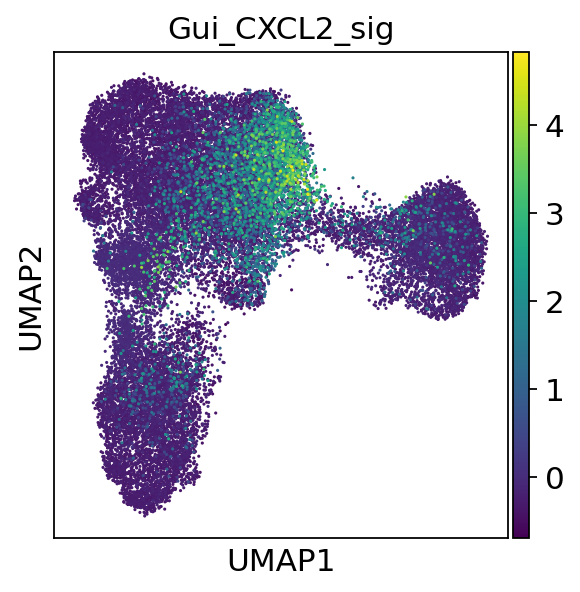

In [17]:
#plotting 
with plt.rc_context({"figure.figsize": (4, 4)}):
    sc.pl.umap(data, color=gene_sets, ncols=2, size=8)

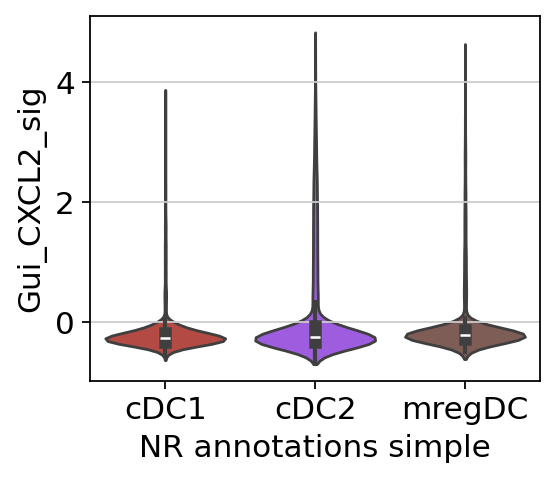

In [16]:
# Plot violins
with plt.rc_context({"figure.figsize": (4, 3)}):
    for gene in gene_sets.keys():
        sc.pl.violin(
            data,
            keys=gene,
            groupby='NR_annotations_simple',
            stripplot=False,
            inner='box',
            show=True
            #save=f"_DC_sigoverlay_Violin_{gene}.svg"
        )

# Overlaying CD1A and LTB (cDC2A Sig)

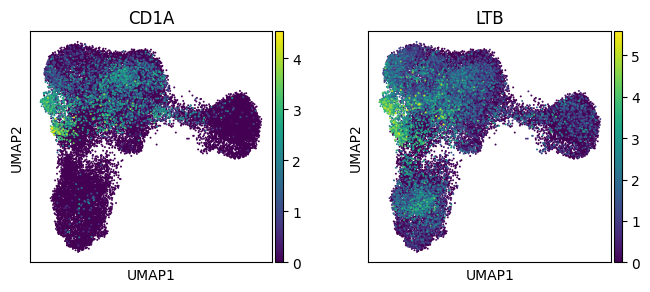

In [ ]:
#plotting 
with plt.rc_context({"figure.figsize": (3, 3)}):
    sc.pl.umap(data, color=["CD1A","LTB"], ncols=2, size=8)

In [5]:
DC2A = ['LTB','CD1A'] 

In [6]:
# Define dictionary of gene sets
gene_sets = {
    "DC2A_sig": DC2A
}

In [7]:
# Loop through each gene set and calculate the scores
for name, genes in gene_sets.items():
    sc.tl.score_genes(data, genes, score_name=name)

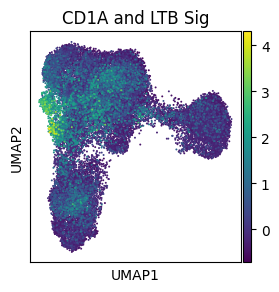

In [10]:
#plotting 
with plt.rc_context({"figure.figsize": (3, 3)}):
    sc.pl.umap(data, color=gene_sets, ncols=1, size=8, title="CD1A and LTB Sig")

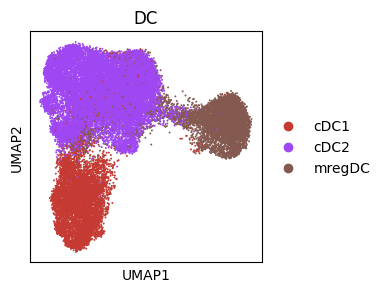

In [12]:
#plotting 
with plt.rc_context({"figure.figsize": (3, 3)}):
    sc.pl.umap(data, color="NR_annotations_simple", ncols=1, size=8, title="DC")